#  Standard Imports

In [1]:
import pandas as pd
import seaborn as sns
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import os
import pydotplus
import graphviz

from IPython.display import Image

#Import for smote  - install pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE


from io import StringIO
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import linear_model 
from sklearn import tree

from scipy.io import arff

#make it pretty
sns.set_color_codes()


plt.rcParams["figure.figsize"] = "25,10"
plt.rcParams["legend.fontsize"] = 16
plt.rcParams["axes.labelsize"] = 16

data = pd.read_csv("river.csv")


/Users/benjamincashman/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/benjamincashman/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/benjamincashman/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/benjamincashman/.local/lib/python3.6/site-packages/ten

# Exploratory Data Analysis

In [2]:
#lets see if we've got any null values
data.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6311 entries, 0 to 6310
Data columns (total 3 columns):
x1    6311 non-null float64
x2    6311 non-null float64
t     6311 non-null float64
dtypes: float64(3)
memory usage: 148.0 KB


In [3]:
#our first look at the data
data.head()

,x1,x2,t
0,6.085486,43.226207,0.0
1,4.147929,-117.512434,0.0
2,6.459521,97.007536,0.0
3,2.350155,-0.554253,0.0
4,0.992671,61.111770,0.0


In [4]:
#lets look at our variable ranges
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
x1,6311.0,3.477977,2.016079,0.002324,1.723568,3.436070,5.209477,6.999034
x2,6311.0,2.811144,84.502360,-149.995478,-69.039539,4.819181,76.604580,153.720038
t,6311.0,0.683093,0.465308,0.000000,0.000000,1.000000,1.000000,1.000000


In [5]:
#before we get to work lets split the data in to test and training

#supporting data for prediction using all but target variable
X,t = data[['x1','x2']], data['t'].astype('category')

#establish our target variable
y = t

#split the data up %50 each
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)  #test_size=0.50,

#Check to see our split
X_train.shape, y_train.shape
X_test.shape, y_test.shape


#now lets scale the data as X1 and X2 are vastly different in range
scaler = StandardScaler()

X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=('x','y'))
X_test = scaler.transform(X_test)

X_train.describe()

,x,y
count,4.733000e+03,4733.000000
mean,1.944122e-16,0.000000
std,1.000106e+00,1.000106
min,-1.717004e+00,-1.791347
25%,-8.703280e-01,-0.850084
50%,-1.933205e-02,0.011993
75%,8.546063e-01,0.878550
max,1.742853e+00,1.805539


# Data Visualization

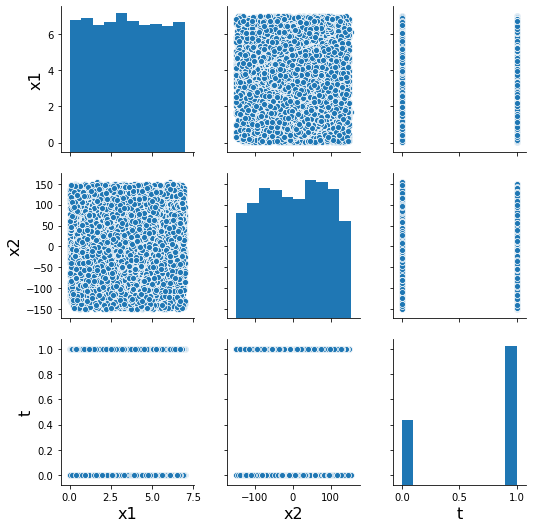

In [6]:
sns.pairplot(data);

# Univariate Analysis

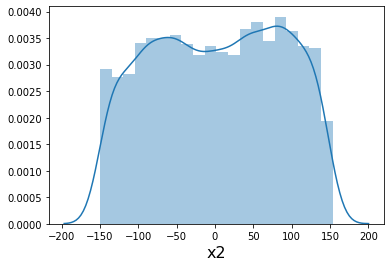

In [7]:
#deep look at x2 variable
sns.distplot(data.x2);

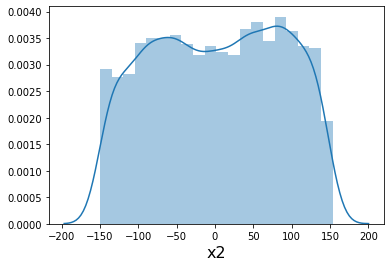

In [8]:
#deep look at x1 variable
sns.distplot(data.x2);

# Visualizaiton of variable classification and counts

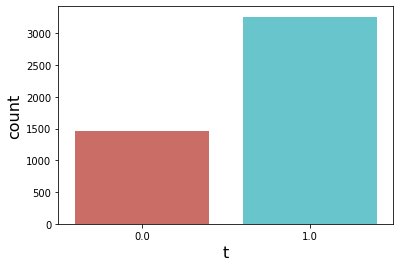

In [9]:
#lets take a look at our target variable - t here we see there are more of one class
sns.countplot(y_train, data = data, palette='hls');

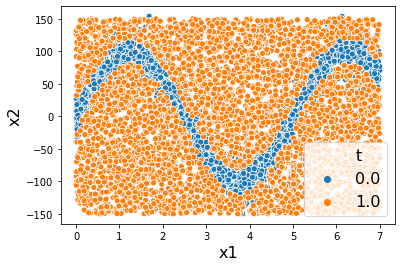

In [10]:
#zooming in on the river with blue / orange classifiers
sns.scatterplot(data = data, x= data.x1, y = data.x2, hue=data.t);

In [11]:
#lets fit a line for fun
lm = linear_model.LinearRegression()

model = lm.fit(X_train, y_train)
predictions = lm.predict(X_test)

In [12]:
#Oops! that was terrible
model.score(X_test,y_test)

0.008280222048188568

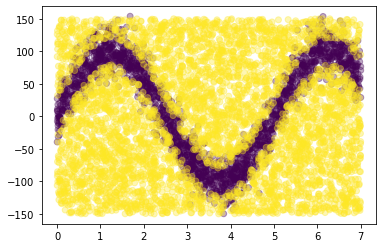

In [13]:
#here we can take a new look at our training
plt.scatter(X['x1'],X['x2'], c=y, alpha=.35);

/Users/benjamincashman/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/benjamincashman/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


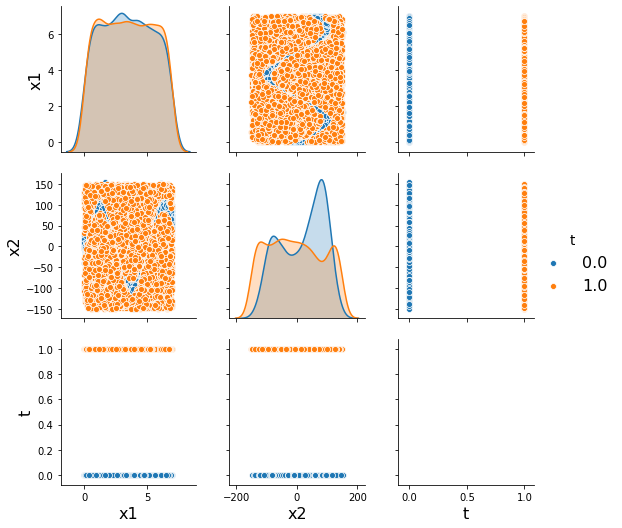

In [14]:
#taking a fresh look at the pairplot
sns.pairplot(data,hue ='t');

# Creating a classification tree and visualizing results

In [15]:
# pydotplus
#import graphviz
#from IPython.display import Image
#now that we have a target and know what our data looks like lets build a tree for classification
classifier = tree.DecisionTreeClassifier().fit(X_train, y_train)
dot_data = StringIO()

export_graphviz(classifier, out_file=dot_data, filled=True, rounded=True,special_characters=True)

#now we will draw the graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

In [16]:
#now we've seen our model lets see how well it does
labels = classifier.predict(X_test)
probabilities = classifier.predict_proba(X_test)
matrix = confusion_matrix(y_test, labels)
report = classification_report(y_test, labels)

print("Here is our confusion matrix")
print(matrix)


print("And now our Report")
print(report)


Here is our confusion matrix
[[409 122]
 [ 89 958]]
And now our Report
              precision    recall  f1-score   support

         0.0       0.82      0.77      0.79       531
         1.0       0.89      0.91      0.90      1047

    accuracy                           0.87      1578
   macro avg       0.85      0.84      0.85      1578
weighted avg       0.86      0.87      0.87      1578



[(-2, 2), Text(0, 0.5, '$y$'), (-2, 2), Text(0.5, 0, '$x$'), None]

<Figure size 1440x1440 with 0 Axes>

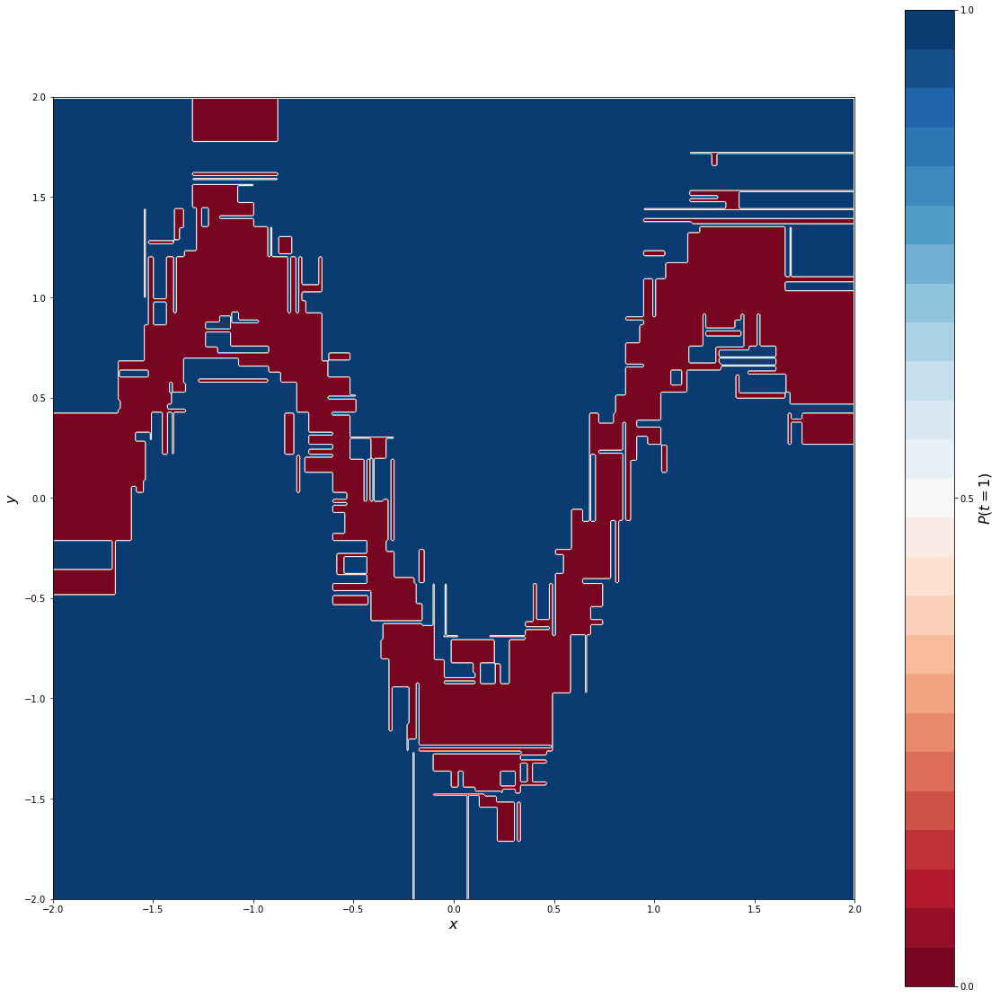

In [17]:
#next we can plot the predictd regions superimposed on the data
plt.figure(figsize=(20,20));
sample_x, sample_y = np.mgrid[-2:2:.01, -2:2:.01];
grid = np.c_[sample_x.ravel(), sample_y.ravel()];

probs = classifier.predict_proba(grid)[:,1].reshape(sample_x.shape);

#now its time to draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20))
contour = axes.contourf(sample_x,
                       sample_y,
                       probs,
                       25,
                       cmap="RdBu",
                       vmin=0,
                       vmax=1)

axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks([0.0,0.5,1.0])


#lets add those labels
axes.set(aspect="equal",
        xlim=(-2,2),
        ylim=(-2,2),
        xlabel="$x$",
        ylabel="$y$"
        )


In [19]:
#lets reduce the amount of leaves in our tree classifier model 
classifier = tree.DecisionTreeClassifier(min_samples_leaf=20).fit(X_train, y_train)

In [20]:
#now lets look at the updated graph with gini index

# Result of our tree with 20 leaves

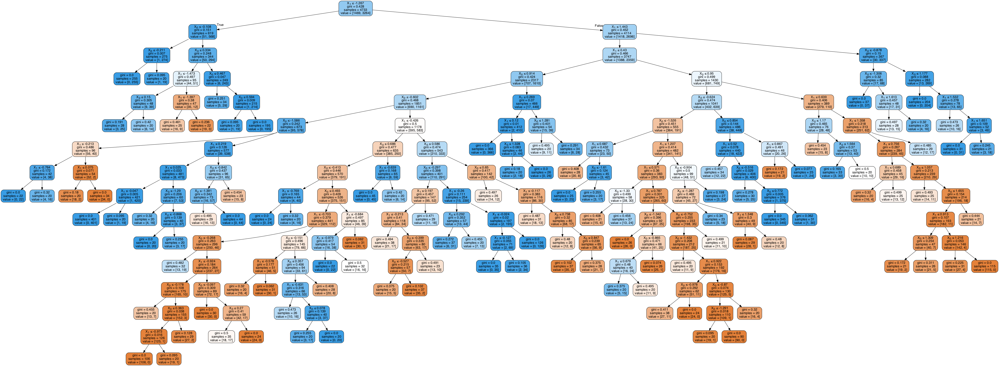

In [21]:
dot_data = StringIO()

export_graphviz(classifier, out_file=dot_data, filled=True, rounded=True,special_characters=True)

#now we will draw the graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

In [22]:
#here we can see a model which hopefully has less over fitting

[(-2, 2), Text(0, 0.5, '$y$'), (-2, 2), Text(0.5, 0, '$x$'), None]

<Figure size 1440x1440 with 0 Axes>

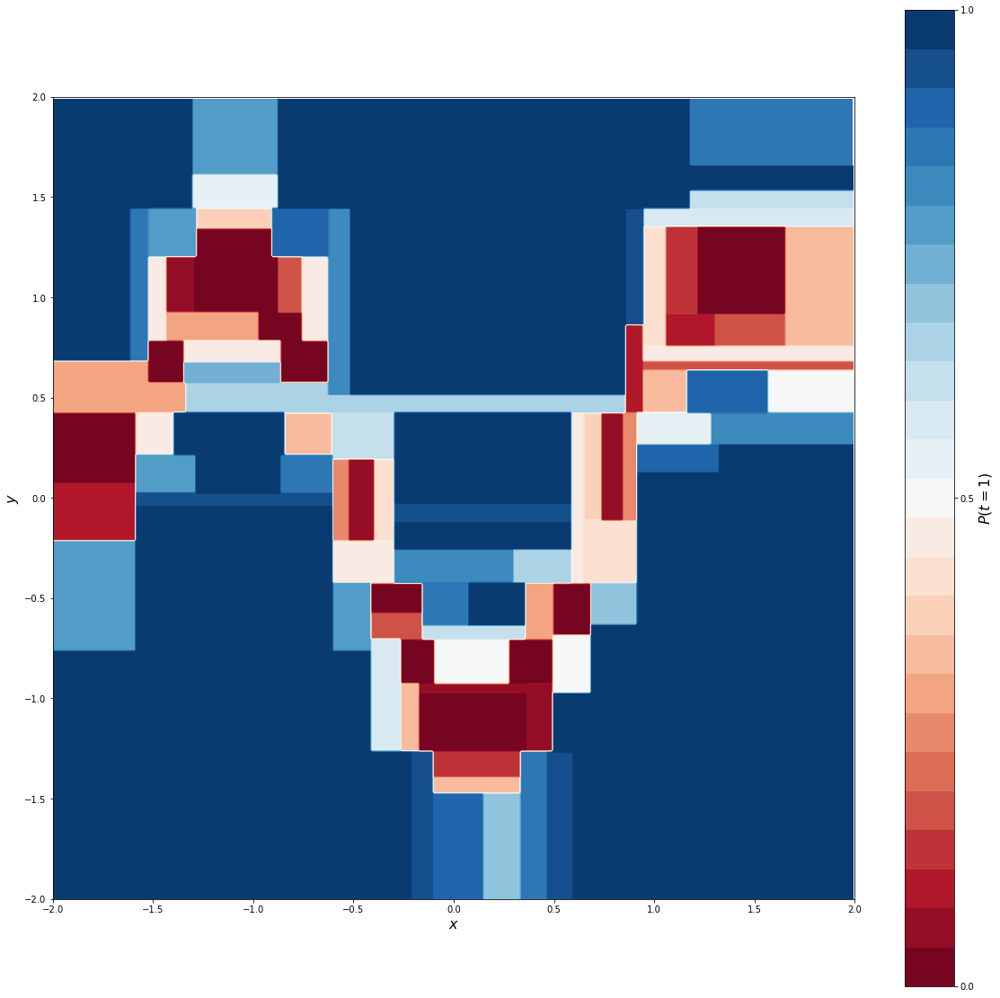

In [23]:
#next we can plot the predictd regions superimposed on the data
plt.figure(figsize=(20,20));
sample_x, sample_y = np.mgrid[-2:2:.01, -2:2:.01];
grid = np.c_[sample_x.ravel(), sample_y.ravel()];

probs = classifier.predict_proba(grid)[:,1].reshape(sample_x.shape);

#now its time to draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20))
contour = axes.contourf(sample_x,
                       sample_y,
                       probs,
                       25,
                       cmap="RdBu",
                       vmin=0,
                       vmax=1)

axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks([0.0,0.5,1.0])


#lets add those labels
axes.set(aspect="equal",
        xlim=(-2,2),
        ylim=(-2,2),
        xlabel="$x$",
        ylabel="$y$"
        )


In [25]:
#here - lets test our model again with some metrics
labels = classifier.predict(X_test)
probabilities = classifier.predict_proba(X_test)
matrix = confusion_matrix(y_test, labels)
report = classification_report(y_test, labels)

print("Here is our confusion matrix")
print(matrix)


print("And now our Report")
print(report)

Here is our confusion matrix
[[423 108]
 [118 929]]
And now our Report
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79       531
         1.0       0.90      0.89      0.89      1047

    accuracy                           0.86      1578
   macro avg       0.84      0.84      0.84      1578
weighted avg       0.86      0.86      0.86      1578



In [26]:
#now lets take a look at feature importance when it comes to classifying
list(zip(X.columns, classifier.feature_importances_))

#X1 is seemingly 2x more important in determining the class!

[('x1', 0.6576670912206127), ('x2', 0.3423329087793871)]

# Random forest

In [30]:
#now that we've seen how our tree is working  lets move on to our Random forest ensemble method
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_jobs= -1 , random_state = 42).fit(X_train,y_train)

/Users/benjamincashman/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[(-2, 2), Text(0, 0.5, '$y$'), (-2, 2), Text(0.5, 0, '$x$'), None]

<Figure size 1440x1440 with 0 Axes>

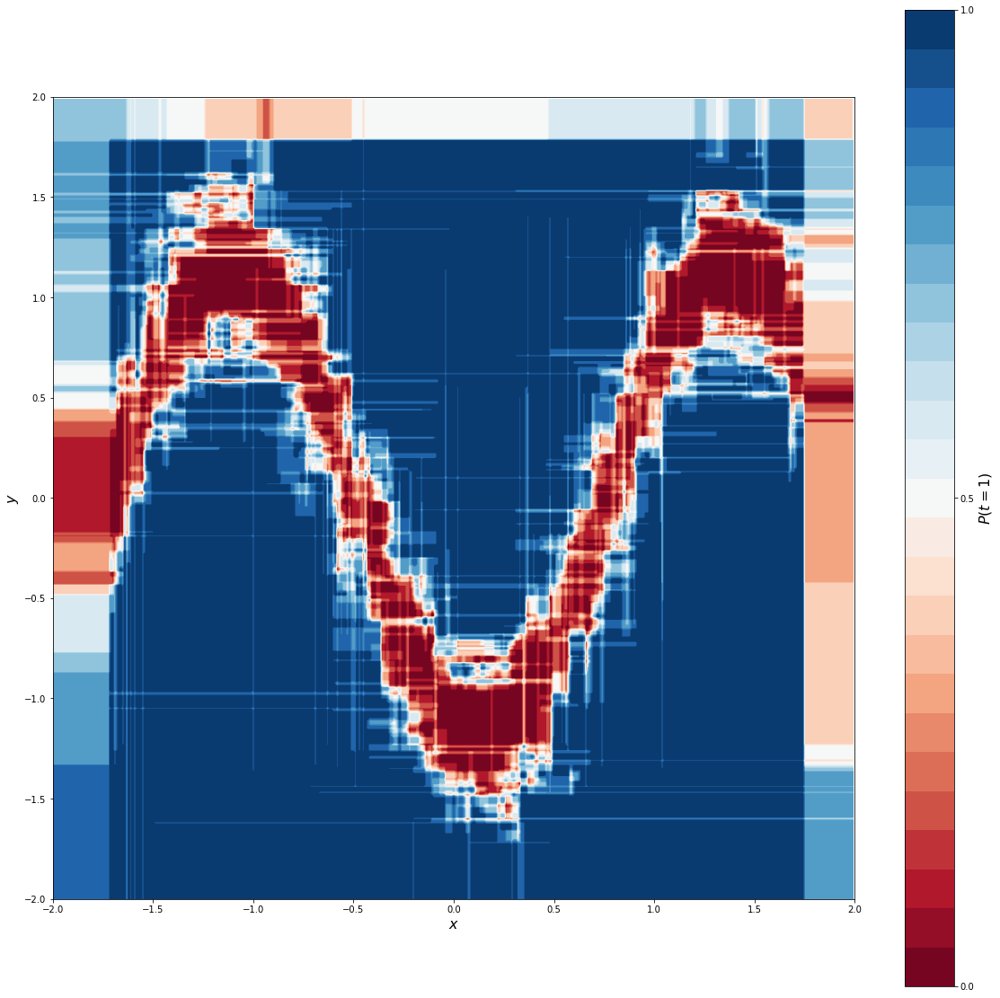

In [31]:
#lets now take a look at our random forest visually
plt.figure(figsize=(20,20));
sample_x, sample_y = np.mgrid[-2:2:.01, -2:2:.01];
grid = np.c_[sample_x.ravel(), sample_y.ravel()];

probs = classifier.predict_proba(grid)[:,1].reshape(sample_x.shape);

#now its time to draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20))
contour = axes.contourf(sample_x,
                       sample_y,
                       probs,
                       25,
                       cmap="RdBu",
                       vmin=0,
                       vmax=1)

axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks([0.0,0.5,1.0])


#lets add those labels
axes.set(aspect="equal",
        xlim=(-2,2),
        ylim=(-2,2),
        xlabel="$x$",
        ylabel="$y$"
        )


# Extremely Randomized Trees

In [35]:
#now lets try our hand at utilizing extremly randomized trees which will increase the bias and reduce variance
from sklearn.ensemble import ExtraTreesClassifier
classifier = ExtraTreesClassifier(n_estimators=10, max_depth = None, min_samples_split=2, random_state = 42).fit(X_train,y_train)

[(-2, 2), Text(0, 0.5, '$y$'), (-2, 2), Text(0.5, 0, '$x$'), None]

<Figure size 1440x1440 with 0 Axes>

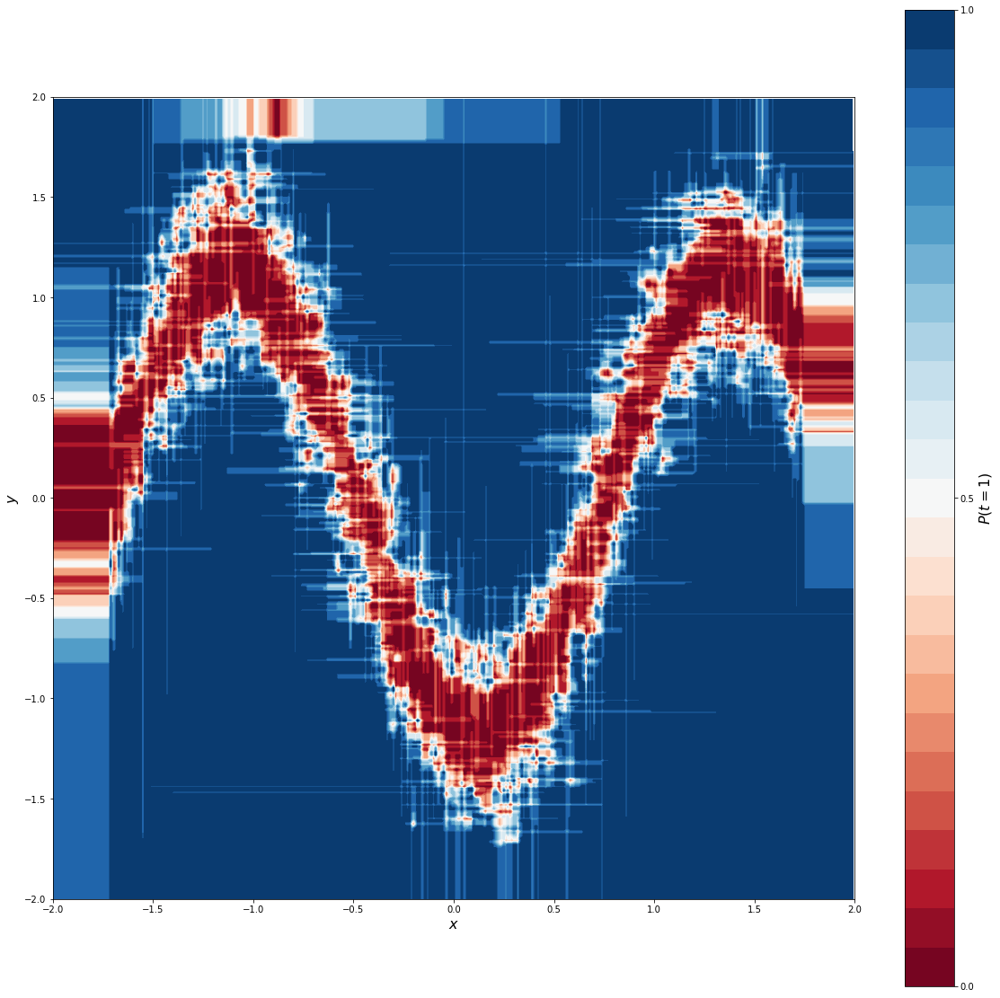

In [36]:
#lets now take a look at our random forest visually
plt.figure(figsize=(20,20));
sample_x, sample_y = np.mgrid[-2:2:.01, -2:2:.01];
grid = np.c_[sample_x.ravel(), sample_y.ravel()];

probs = classifier.predict_proba(grid)[:,1].reshape(sample_x.shape);

#now its time to draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20))
contour = axes.contourf(sample_x,
                       sample_y,
                       probs,
                       25,
                       cmap="RdBu",
                       vmin=0,
                       vmax=1)

axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks([0.0,0.5,1.0])


#lets add those labels
axes.set(aspect="equal",
        xlim=(-2,2),
        ylim=(-2,2),
        xlabel="$x$",
        ylabel="$y$"
        )


In [37]:
#here - lets test our model again with some metrics
labels = classifier.predict(X_test)
probabilities = classifier.predict_proba(X_test)
matrix = confusion_matrix(y_test, labels)
report = classification_report(y_test, labels)

print("Here is our confusion matrix")
print(matrix)


print("And now our Report")
print(report)

Here is our confusion matrix
[[429 102]
 [ 87 960]]
And now our Report
              precision    recall  f1-score   support

         0.0       0.83      0.81      0.82       531
         1.0       0.90      0.92      0.91      1047

    accuracy                           0.88      1578
   macro avg       0.87      0.86      0.86      1578
weighted avg       0.88      0.88      0.88      1578



# Adaboost Classifier

In [41]:
#lets give the data set a trial with another classifier AdaBOOST
from sklearn.ensemble import AdaBoostClassifier
#create classifier object 
classifier = AdaBoostClassifier(n_estimators=100)
#fit the model
classifier.fit(X_train,y_train)

labels = classifier.predict(X_test)
probabilities = classifier.predict_proba(X_test)


matrix = confusion_matrix(y_test, labels)
report = classification_report(y_test, labels)

print("Here is our confusion matrix")
print(matrix)


print("And now our Report")
print(report)

Here is our confusion matrix
[[123 408]
 [139 908]]
And now our Report
              precision    recall  f1-score   support

         0.0       0.47      0.23      0.31       531
         1.0       0.69      0.87      0.77      1047

    accuracy                           0.65      1578
   macro avg       0.58      0.55      0.54      1578
weighted avg       0.62      0.65      0.61      1578



# Gradient Boosting Classifier


In [43]:
#lets give the data set a trial with another classifier AdaBOOST
from sklearn.ensemble import GradientBoostingClassifier

#create classifier object 
classifier = GradientBoostingClassifier(n_estimators=100, learning_rate = 1.0, max_depth=1,random_state=0)
#fit the model
classifier.fit(X_train,y_train)

classifier.score(X_test,y_test)

labels = classifier.predict(X_test)
probabilities = classifier.predict_proba(X_test)


matrix = confusion_matrix(y_test, labels)
report = classification_report(y_test, labels)

print("Here is our confusion matrix")
print(matrix)


print("And now our Report")
print(report)

Here is our confusion matrix
[[125 406]
 [142 905]]
And now our Report
              precision    recall  f1-score   support

         0.0       0.47      0.24      0.31       531
         1.0       0.69      0.86      0.77      1047

    accuracy                           0.65      1578
   macro avg       0.58      0.55      0.54      1578
weighted avg       0.62      0.65      0.61      1578

